In [22]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Show all columns when printing
pd.set_option('display.max_columns', None)

In [23]:
features = pd.read_csv('src/data/training/processed/final_training_data.csv')

In [24]:
features['mix__sd_od_history_to_kyc_ratio'] = features['od__history_length_days'] / features['sd__age_since_first_kyc']

In [25]:
features.head()

,user_id,reference_date,ob__limit_ref,ob__balance_ref,ob__avg_util_ref,ob__open_limit_ref,t__is_drawn,t__ccf,mv__is_lisbon_v1,mv__is_lisbon_v2,mv__is_lisbon_v3,mv__is_lisbon_v4,mv__is_porto_v1,mv__is_porto_v2,ef__is_covid,gender,nationality,sd__age,sd__age_since_first_kyc,sd__age_since_last_kyc,sd__membership_product,sd__max_daily_logins_6m,sd__max_daily_logins_12m,madrid__avg_monthly_salary_3m,madrid__avg_monthly_expenses_3m,madrid__avg_monthly_repayment_capacity_3m,ul__is_expat,od__history_length_days,od__is_history,ob__avg_util_3m,ob__avg_util_change_3m,ob__max_util_3m,ob__max_util_change_3m,ob__std_util_3m,ob__std_util_change_3m,ob__util_slope_3m,ob__util_range_3m,ob__num_od_entries_6m,ob__num_od_exits_6m,ob__overlimit_days_6m,ob__full_repayment_events_6m,ob__max_consecutive_od_days_since_creation_ratio,ob__od_draw_days_6m,ob__od_enabled_zero_util_days_6m,ob__technical_od_days_6m,ob__technical_od_deep_days_6m,ob__avg_util_first_2m_since_creation,ob__avg_util_change_last2m_to_first2m,ob__avg_util_first2m_1y,ob__avg_util_change_last2m_to_first2m_1y,ob__max_consecutive_overlimit_days_since_creation_ratio,ob__partial_repayment_events_6m,ob__full_repayment_change_3m_vs_prev_3m,ob__util_last2m_to_first2m_ratio,ob__util_last2m_to_first2m_1y_ratio,ob__max_to_avg_util_3m_ratio,ab__avg_bal_3m,ab__avg_bal_change_3m,ab__max_util_3m,ab__max_bal_change_3m,ab__std_util_3m,ab__std_bal_change_3m,ab__bal_changed_3m,ab__bal_change_freq_3m,ab__mean_abs_change_6m,ab__std_abs_change_6m,ab__max_one_day_drop_6m,ab__inflow_spike_count_6m,ab__days_down_6m,ab__near_zero_days_6m,dn__recent_action,dn__max_action_level,cb__most_recent_score,cb__worst_score,ep__cc_tbil_balance,mix__sd_od_history_to_kyc_ratio
0,e71e8a98-7408-4a0a-9ffb-aa634d49e6a9,2023-08-21,6000.0,5998.78,0.9998,0.0002,1,1.00000,1,0,0,0,0,0,0,1.0,6.0,40,2017.0,2017.0,7.0,30.0,30.0,0.00,0.000000,1169.000000,0,2018,1,1.007732,0.015231,1.029796,0.030621,0.022957,-0.014908,2.739301e-09,0.188728,0,0,56,0,0.0,181,0,0,0,0.739344,0.275498,1.006010,0.008832,0.0,6,0,1.3726,1.0087,1.0218,-6046.395604,-91.389398,-5046.41,-952.37,137.744446,-8.944555e+01,1,4,56.875083,348.784107,-3384.51,3,6,0,1.0,90.0,3.0,3.0,0.0,1.000496
1,e928e2e6-531b-4e23-928e-613c8d622dfd,2024-07-30,250.0,0.00,0.0000,1.0000,1,0.14040,0,0,0,0,1,0,0,0.0,96.0,45,150.0,150.0,7.0,7.0,7.0,0.00,0.000000,10.000000,1,136,1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,2,2,9,2,0.0,19,117,0,0,0.234047,-0.234047,NaN,NaN,0.0,0,-2,0.0000,NaN,NaN,2.112198,-0.610000,2.32,-0.61,0.290700,4.689331e-16,1,1,17.201000,90.570267,-590.49,3,6,124,10.0,10.0,2.0,2.0,0.0,0.906667
2,eaaee9d7-3aea-4a4c-aaa3-65c2c1b4191f,2022-12-07,500.0,0.00,0.0000,1.0000,1,1.00000,1,0,0,0,0,0,0,1.0,27.0,27,2224.0,2224.0,6.0,7.0,7.0,0.00,607.000000,1881.333333,0,2225,1,0.163381,-0.479873,0.729000,-0.713720,0.299839,-0.341119,-7.610887e-08,0.729000,3,4,0,4,0.0,46,135,0,0,0.000000,0.006275,0.433903,-0.427628,0.0,1,2,NaN,0.0144,4.4619,232.568022,1059.584624,3492.36,3412.86,904.980947,1.130881e+03,1,20,57.020552,356.241185,-3063.00,5,19,46,NaN,NaN,4.0,4.0,0.0,1.000450
3,ed03a294-1ebb-473b-97e8-5a0abab56b8d,2018-11-27,250.0,0.00,0.0000,1.0000,0,0.00000,1,0,0,0,0,0,0,1.0,27.0,29,505.0,505.0,2.0,12.0,19.0,10311.25,25706.363333,24658.186667,0,1,1,0.000000,NaN,0.000000,NaN,NaN,NaN,0.000000e+00,0.000000,0,0,0,0,NaN,0,1,0,0,0.000000,0.000000,NaN,NaN,NaN,0,0,NaN,NaN,NaN,1139.883626,656.021624,4717.45,2087.02,1105.999238,7.997399e+02,1,69,529.733204,912.332390,-3813.61,40,84,1,NaN,NaN,6.0,7.0,0.0,0.001980
4,f0560a88-6dbd-4c5c-965d-9c6dc11ab2a0,2022-02-08,500.0,0.00,0.0000,1.0000,1,0.26204,1,0,0,0,0,0,0,1.0,125.0,25,111.0,111.0,7.0,2.0,2.0,0.00,43.046667,88.163333,1,1,1,0.000000,NaN,0.000000,NaN,NaN,NaN,0.000000e+00,0.000000,0,0,0,0,NaN,0,1,0,0,0.000000,0.000000,NaN,NaN,NaN,0,0,NaN,NaN,NaN,62.708022,75.536720,172.30,121.21,53.587515,5.436521e+01,1,24,6.938919,19.735941,-61.58,0,21,42,NaN,NaN,7.0,7.0,0.0,0.009009


In [26]:
features.describe()

,ob__limit_ref,ob__balance_ref,ob__avg_util_ref,ob__open_limit_ref,t__is_drawn,t__ccf,mv__is_lisbon_v1,mv__is_lisbon_v2,mv__is_lisbon_v3,mv__is_lisbon_v4,mv__is_porto_v1,mv__is_porto_v2,ef__is_covid,gender,nationality,sd__age,sd__age_since_first_kyc,sd__age_since_last_kyc,sd__membership_product,sd__max_daily_logins_6m,sd__max_daily_logins_12m,madrid__avg_monthly_salary_3m,madrid__avg_monthly_expenses_3m,madrid__avg_monthly_repayment_capacity_3m,ul__is_expat,od__history_length_days,od__is_history,ob__avg_util_3m,ob__avg_util_change_3m,ob__max_util_3m,ob__max_util_change_3m,ob__std_util_3m,ob__std_util_change_3m,ob__util_slope_3m,ob__util_range_3m,ob__num_od_entries_6m,ob__num_od_exits_6m,ob__overlimit_days_6m,ob__full_repayment_events_6m,ob__max_consecutive_od_days_since_creation_ratio,ob__od_draw_days_6m,ob__od_enabled_zero_util_days_6m,ob__technical_od_days_6m,ob__technical_od_deep_days_6m,ob__avg_util_first_2m_since_creation,ob__avg_util_change_last2m_to_first2m,ob__avg_util_first2m_1y,ob__avg_util_change_last2m_to_first2m_1y,ob__max_consecutive_overlimit_days_since_creation_ratio,ob__partial_repayment_events_6m,ob__full_repayment_change_3m_vs_prev_3m,ob__util_last2m_to_first2m_ratio,ob__util_last2m_to_first2m_1y_ratio,ob__max_to_avg_util_3m_ratio,ab__avg_bal_3m,ab__avg_bal_change_3m,ab__max_util_3m,ab__max_bal_change_3m,ab__std_util_3m,ab__std_bal_change_3m,ab__bal_changed_3m,ab__bal_change_freq_3m,ab__mean_abs_change_6m,ab__std_abs_change_6m,ab__max_one_day_drop_6m,ab__inflow_spike_count_6m,ab__days_down_6m,ab__near_zero_days_6m,dn__recent_action,dn__max_action_level,cb__most_recent_score,cb__worst_score,ep__cc_tbil_balance,mix__sd_od_history_to_kyc_ratio
count,15211.000000,15211.000000,15211.000000,15211.000000,15211.000000,15211.000000,15211.000000,15211.000000,15211.000000,15211.000000,15211.000000,15211.000000,15211.000000,15211.000000,15211.000000,15211.000000,15038.000000,15038.000000,14979.000000,14370.000000,14631.000000,13187.000000,13187.000000,13187.000000,15211.000000,15211.000000,15211.000000,15157.000000,11213.000000,15157.000000,11213.000000,11906.000000,11164.000000,1.515700e+04,15157.000000,15211.000000,15211.000000,15211.000000,15211.000000,12103.000000,15211.000000,15211.000000,15211.000000,15211.000000,15122.000000,15122.000000,8779.000000,8772.000000,7283.000000,15211.000000,15211.000000,10529.00000,7649.000000,11655.000000,15211.000000,14580.000000,15211.000000,14580.000000,15121.000000,1.457400e+04,15211.000000,15211.000000,15121.000000,15092.000000,15121.000000,15211.000000,15211.000000,15211.000000,6354.000000,6354.000000,15160.000000,15160.000000,15211.000000,15038.000000
mean,2935.840707,1810.639463,0.549379,0.470113,0.692328,0.595126,0.865624,0.044376,0.011571,0.013806,0.011571,0.053054,0.104069,0.745382,38.851818,34.576031,1138.351842,1079.259675,5.500167,10.045024,11.807122,923.804383,1970.497335,2390.465484,0.352640,674.676090,0.997370,0.521338,0.029753,0.662670,0.027962,0.130887,-0.000172,2.664058e-08,0.351273,1.338308,1.252120,11.096378,1.252120,0.086177,106.035698,24.562159,1.904148,1.904148,0.308431,0.217720,0.576879,0.110287,0.001236,8.957071,0.041417,281.89728,29.004247,2.726478,-1109.217250,-148.540442,774.327695,-59.905447,677.743072,2.883341e+01,0.968312,37.004602,113.711609,335.020560,-1673.912786,6.773519,55.876800,23.983499,6.973875,15.075071,4.531926,5.858839,198.299366,0.532549
std,3174.355519,2651.135979,0.720992,0.440627,0.461545,0.459190,0.341068,0.205935,0.106946,0.116688,0.106946,0.224148,0.305361,0.435812,29.748096,11.013407,757.438483,743.278784,2.253923,8.691998,9.716007,4589.203854,6553.386662,7657.597936,0.477807,668.311102,0.051215,0.462133,0.214391,0.517209,0.265151,0.152848,0.114046,1.536199e-07,0.472102,2.664460,2.620585,23.289780,2.620585,0.280637,79.206992,48.242284,9.668041,9.668041,0.433988,0.378305,0.391427,0.323528,0.035134,12.685683,1.216907,9770.82388,938.767216,7.202959,5478.060622,2954.425021,11289.757452,8128.961116,2381.940975,2.769514e+03,0.175173,27.4

In [27]:
features.drop(columns=['user_id'], inplace=True)

Continuous: ['ob__limit_ref', 'ob__balance_ref', 'ob__avg_util_ref', 'ob__open_limit_ref', 't__ccf', 'nationality', 'sd__age', 'sd__age_since_first_kyc', 'sd__age_since_last_kyc', 'sd__max_daily_logins_6m', 'sd__max_daily_logins_12m', 'madrid__avg_monthly_salary_3m', 'madrid__avg_monthly_expenses_3m', 'madrid__avg_monthly_repayment_capacity_3m', 'od__history_length_days', 'ob__avg_util_3m', 'ob__avg_util_change_3m', 'ob__max_util_3m', 'ob__max_util_change_3m', 'ob__std_util_3m', 'ob__std_util_change_3m', 'ob__util_slope_3m', 'ob__util_range_3m', 'ob__num_od_entries_6m', 'ob__num_od_exits_6m', 'ob__overlimit_days_6m', 'ob__full_repayment_events_6m', 'ob__od_draw_days_6m', 'ob__od_enabled_zero_util_days_6m', 'ob__technical_od_days_6m', 'ob__technical_od_deep_days_6m', 'ob__avg_util_first_2m_since_creation', 'ob__avg_util_change_last2m_to_first2m', 'ob__avg_util_first2m_1y', 'ob__avg_util_change_last2m_to_first2m_1y', 'ob__partial_repayment_events_6m', 'ob__full_repayment_change_3m_vs_pre

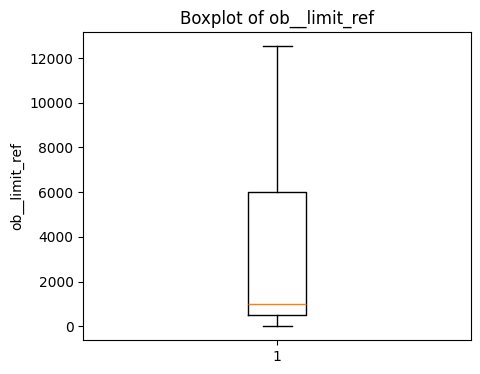

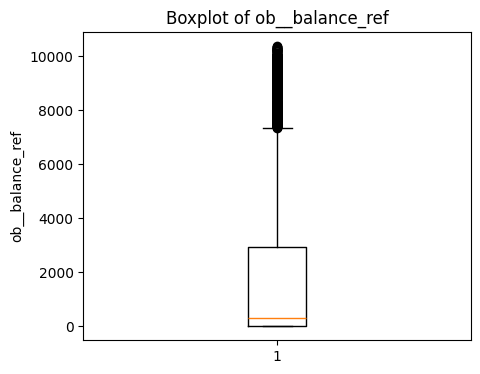

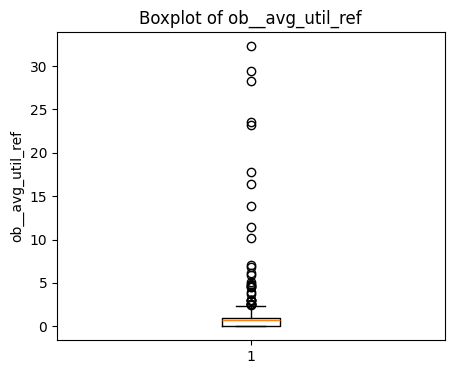

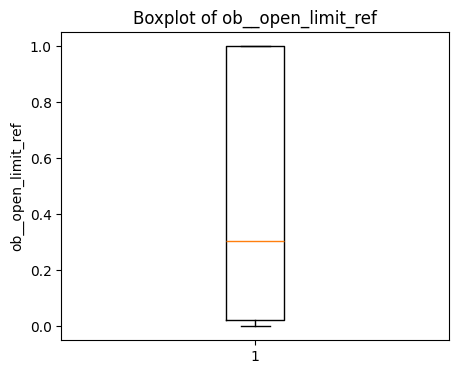

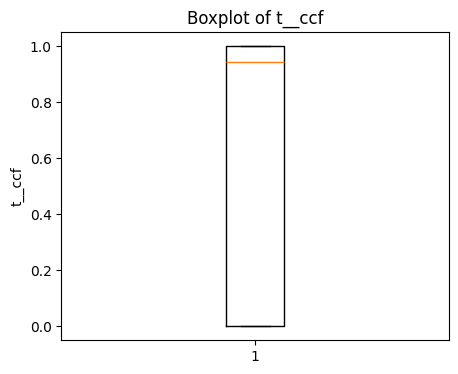

...

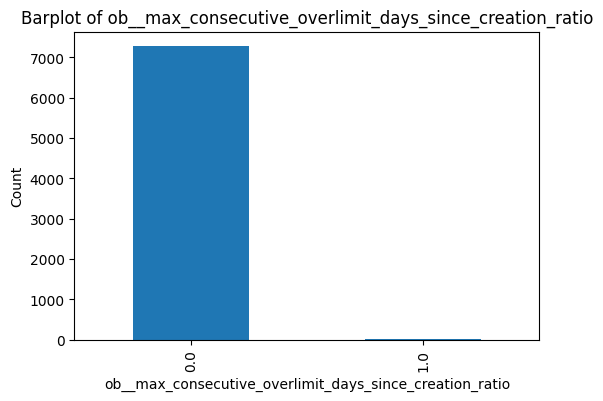

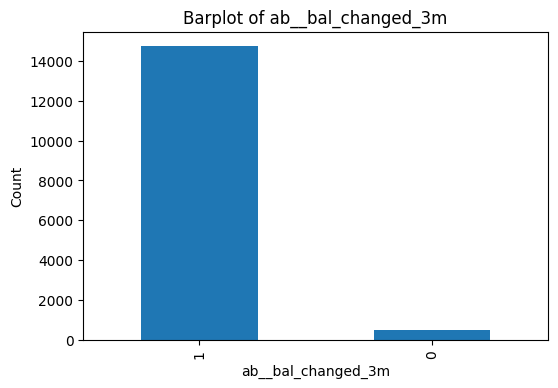

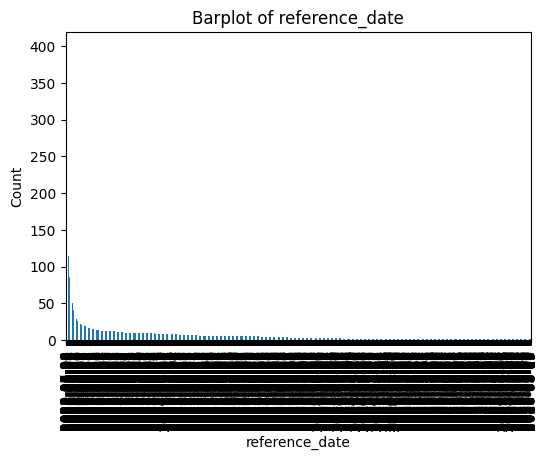

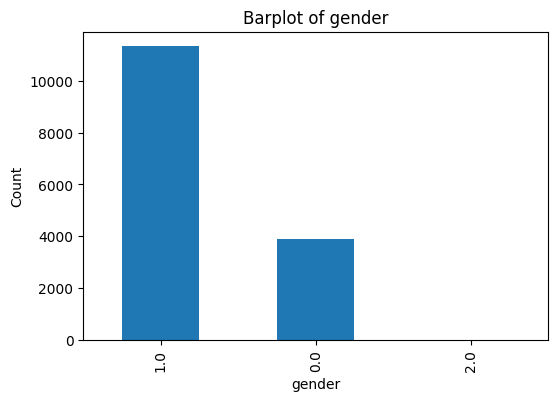

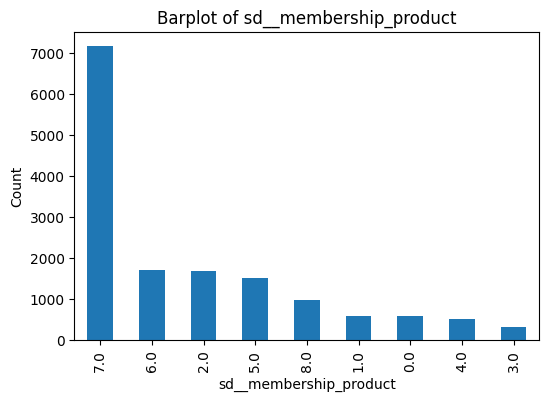

In [28]:
import pandas as pd
import matplotlib.pyplot as plt

# ---- Detect feature types ----
def detect_feature_types(df, cat_threshold=10):
    continuous = []
    categorical = []
    binary = []

    for col in df.columns:
        unique_vals = df[col].dropna().unique()
        
        if df[col].dtype in ['int64', 'float64']:
            if len(unique_vals) == 2:
                binary.append(col)
            elif len(unique_vals) <= cat_threshold:
                categorical.append(col)
            else:
                continuous.append(col)
        else:
            # non-numeric always categorical
            if len(unique_vals) == 2:
                binary.append(col)
            else:
                categorical.append(col)

    return continuous, binary, categorical

# Example: features = your dataframe
continuous, binary, categorical = detect_feature_types(features)

print("Continuous:", continuous)
print("Binary:", binary)
print("Categorical:", categorical)

# ---- Plot continuous (boxplot) ----
for col in continuous:
    plt.figure(figsize=(5, 4))
    plt.boxplot(features[col].dropna())
    plt.title(f'Boxplot of {col}')
    plt.ylabel(col)
    plt.show()

# ---- Plot binary & categorical (barplot) ----
for col in binary + categorical:
    plt.figure(figsize=(6, 4))
    features[col].value_counts().plot(kind="bar")
    plt.title(f'Barplot of {col}')
    plt.xlabel(col)
    plt.ylabel("Count")
    plt.show()

Numeric feature summary:
       ob__limit_ref  ob__balance_ref  ob__avg_util_ref  ob__open_limit_ref  \
count   15211.000000     15211.000000      15211.000000        15211.000000   
mean     2935.840707      1810.639463          0.549379            0.470113   
std      3174.355519      2651.135979          0.720992            0.440627   
min         0.700000         0.000000          0.000000            0.000000   
25%       500.000000         0.000000          0.000000            0.023840   
50%      1000.000000       317.920000          0.697100            0.302900   
75%      6000.000000      2939.160000          0.976160            1.000000   
max     12529.000000     10363.310000         32.275440            1.000000   

       mv__is_lisbon_v1  mv__is_lisbon_v2  mv__is_lisbon_v3  mv__is_lisbon_v4  \
count      15211.000000      15211.000000      15211.000000      15211.000000   
mean           0.865624          0.044376          0.011571          0.013806   
std            0.341

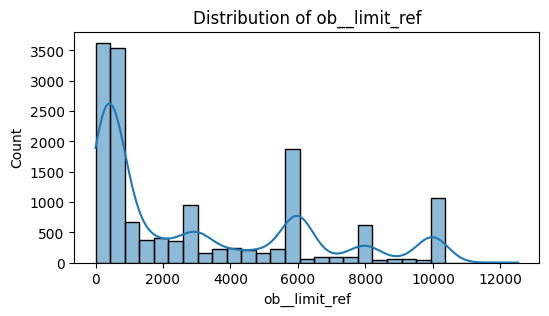

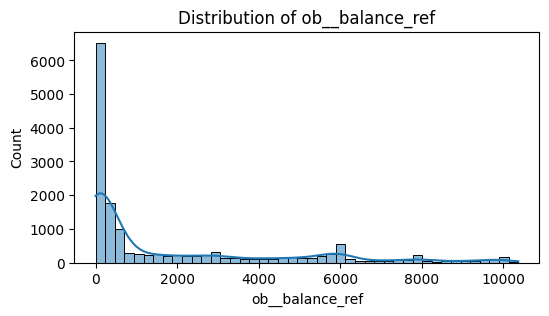

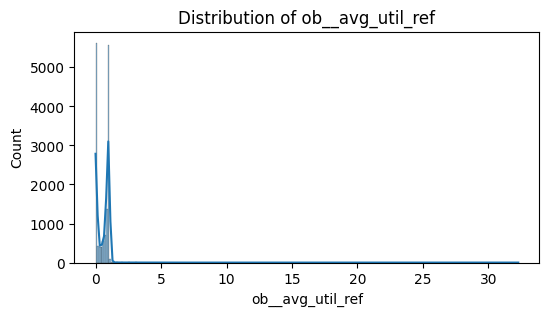

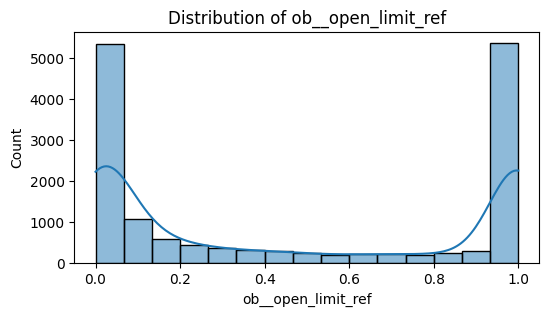

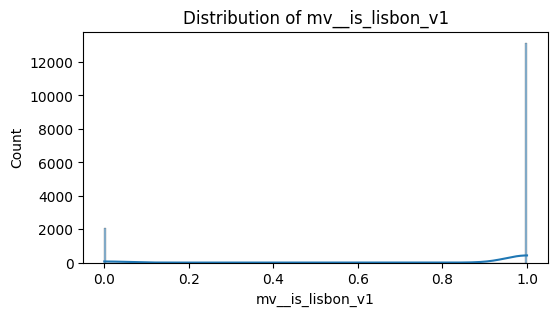

...

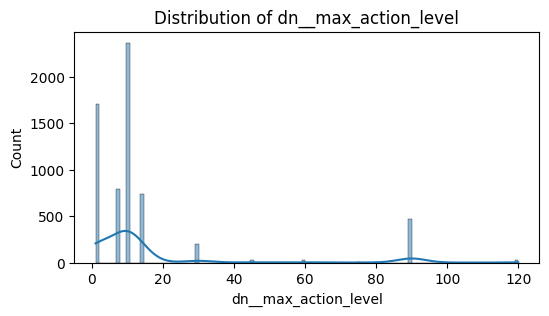

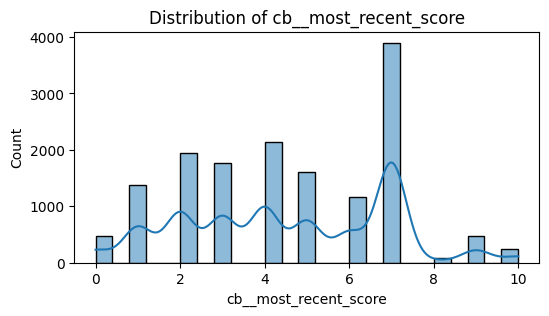

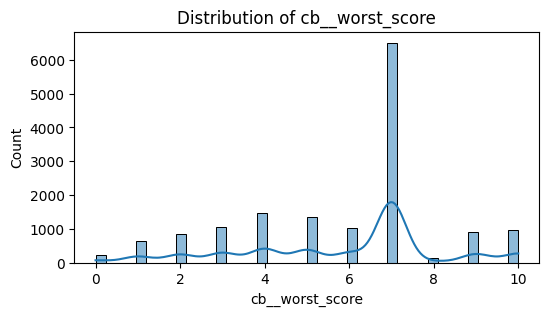

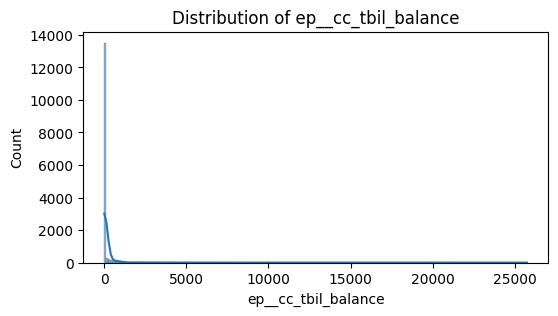

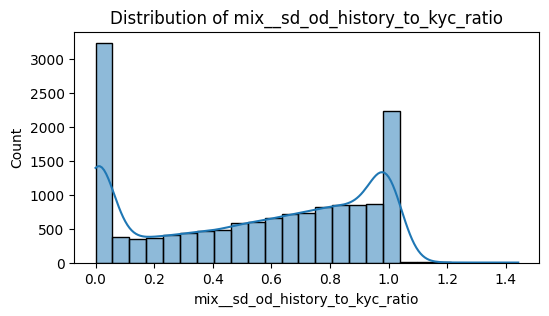

Value counts for reference_date:
 reference_date
2019-07-08    399
2024-05-24    317
2022-06-04    277
2023-02-01    276
2022-03-05    186
             ... 
2017-03-09      1
2021-08-19      1
2025-02-02      1
2018-03-26      1
2020-08-15      1
Name: count, Length: 2212, dtype: int64


Missing values per column:
reference_date                        0
ob__limit_ref                         0
ob__balance_ref                       0
ob__avg_util_ref                      0
ob__open_limit_ref                    0
                                   ... 
dn__max_action_level               8857
cb__most_recent_score                51
cb__worst_score                      51
ep__cc_tbil_balance                   0
mix__sd_od_history_to_kyc_ratio     173
Length: 75, dtype: int64


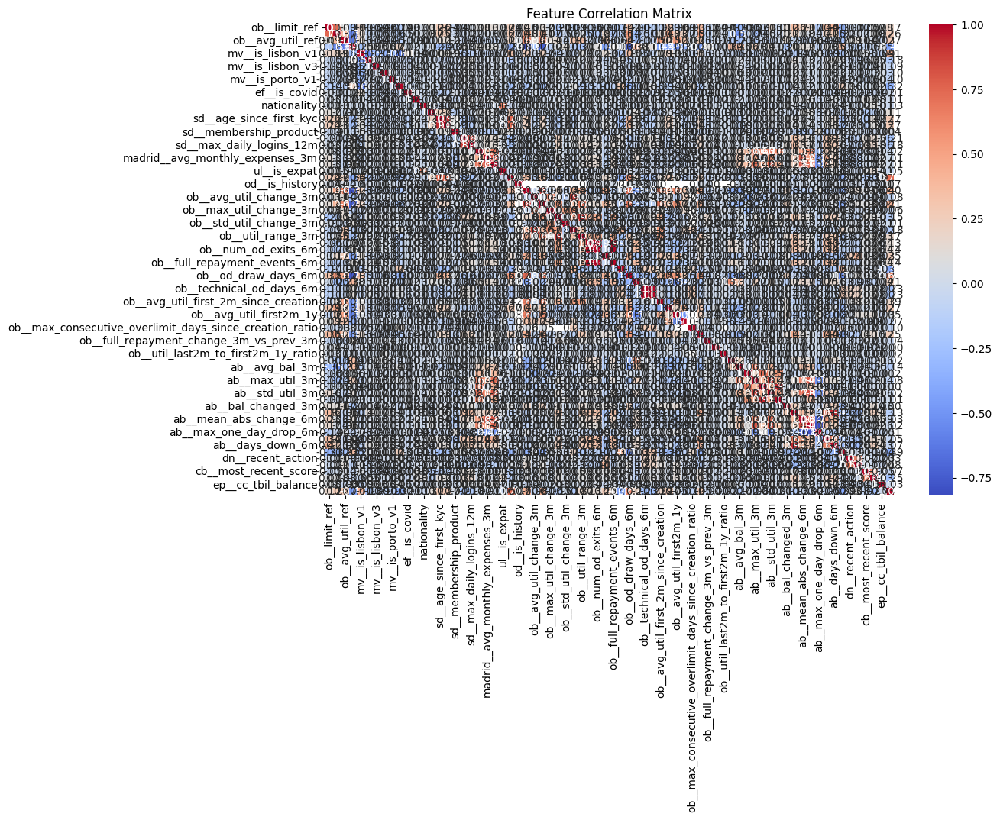


Correlation with target: t__ccf
t__ccf                                   1.000000
ob__avg_util_first2m_1y                  0.176461
ob__avg_util_3m                          0.120773
ob__avg_util_change_last2m_to_first2m    0.107908
ob__max_util_3m                          0.089987
                                           ...   
ob__open_limit_ref                      -0.095538
ab__inflow_spike_count_6m               -0.099527
ab__bal_change_freq_3m                  -0.100568
ab__days_down_6m                        -0.103568
ob__od_enabled_zero_util_days_6m        -0.192293
Name: t__ccf, Length: 73, dtype: float64

Correlation with target: t__is_drawn
t__is_drawn                              1.000000
ul__is_expat                             0.068377
ab__bal_changed_3m                       0.062373
ob__avg_util_first2m_1y                  0.060541
ob__avg_util_change_last2m_to_first2m    0.043914
                                           ...   
ab__inflow_spike_count_6m             

ValueError: could not convert string to float: '2023-08-21'

In [29]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_selection import mutual_info_regression, mutual_info_classif
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Assuming your dataframe is `features`
targets = ['t__ccf', 't__is_drawn']
feature_cols = [c for c in features.columns if c not in targets]

# ==============================
# 1️⃣ Univariate Analysis
# ==============================
# Summary statistics for numeric features
numeric_cols = features[feature_cols].select_dtypes(include=np.number).columns.tolist()
print("Numeric feature summary:")
print(features[numeric_cols].describe())

# Histograms for numeric features
for col in numeric_cols:
    plt.figure(figsize=(6, 3))
    sns.histplot(features[col], kde=True)
    plt.title(f'Distribution of {col}')
    plt.show()

# Summary for categorical features
categorical_cols = features[feature_cols].select_dtypes(include='object').columns.tolist()
for col in categorical_cols:
    print(f"Value counts for {col}:\n", features[col].value_counts())
    print("\n")

# Missing values
print("Missing values per column:")
print(features.isnull().sum())

# ==============================
# 2️⃣ Multivariate Analysis
# ==============================
# Correlation matrix for numeric features
plt.figure(figsize=(12, 8))
sns.heatmap(features[numeric_cols].corr(), annot=True, fmt=".2f", cmap='coolwarm')
plt.title("Feature Correlation Matrix")
plt.show()

# Correlation of numeric features with targets
for target in targets:
    print(f"\nCorrelation with target: {target}")
    corr_with_target = features[numeric_cols + [target]].corr()[target].sort_values(ascending=False)
    print(corr_with_target)

# Mutual Information
for target in targets:
    print(f"\nMutual Information with target: {target}")
    if features[target].nunique() <= 2:  # binary target
        mi = mutual_info_classif(features[feature_cols], features[target], discrete_features='auto', random_state=42)
    else:
        mi = mutual_info_regression(features[feature_cols], features[target], discrete_features='auto', random_state=42)
    mi_series = pd.Series(mi, index=feature_cols).sort_values(ascending=False)
    print(mi_series)

# Variance Inflation Factor (VIF) for numeric features
X = features[numeric_cols].fillna(0)  # fill NAs with 0 or use other imputation
vif_data = pd.DataFrame()
vif_data['feature'] = X.columns
vif_data['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
print("\nVariance Inflation Factor (VIF):")
print(vif_data.sort_values(by='VIF', ascending=False))

In [30]:

# Ensure reference_date is datetime
features['reference_date'] = pd.to_datetime(features['reference_date'])

# Create end-of-month (EOM) column
features['eom'] = features['reference_date'] + pd.offsets.MonthEnd(0)

# Group by EOM and calculate mean of numeric features
df_eom_avg = features.groupby('eom').mean().reset_index()

print(df_eom_avg.head())

         eom                reference_date  ob__limit_ref  ob__balance_ref  \
0 2016-11-30 2016-11-20 16:56:28.235294208     605.882353       169.210588   
1 2016-12-31 2016-12-11 12:00:00.000000000     829.000000       434.503800   
2 2017-01-31 2017-01-13 00:00:00.000000000     630.555556       376.200556   
3 2017-02-28 2017-02-10 20:00:00.000000000     591.666667       162.900000   
4 2017-03-31 2017-03-10 03:12:00.000000000     533.333333       136.966000   

   ob__avg_util_ref  ob__open_limit_ref  t__is_drawn    t__ccf  \
0          0.384867            0.615133     0.588235  0.561912   
1          0.592892            0.407109     0.840000  0.727388   
2          0.507841            0.548006     0.666667  0.533309   
3          0.372517            0.627483     0.333333  0.239670   
4          0.394033            0.606012     0.933333  0.756202   

   mv__is_lisbon_v1  mv__is_lisbon_v2  mv__is_lisbon_v3  mv__is_lisbon_v4  \
0               1.0               0.0               0.0  

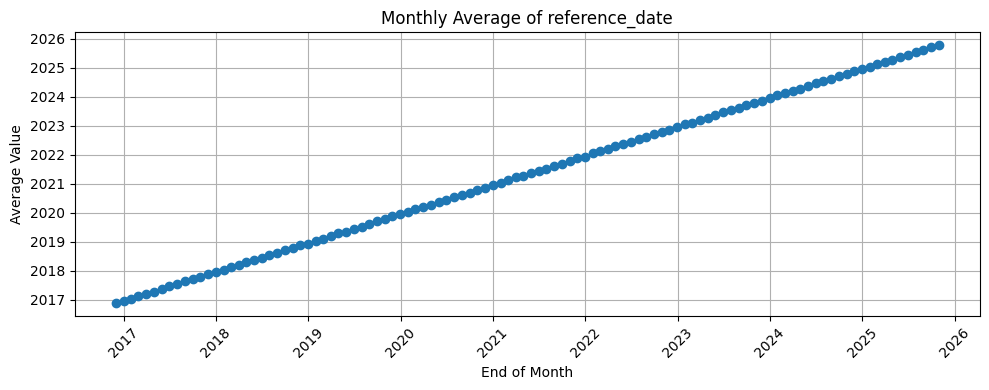

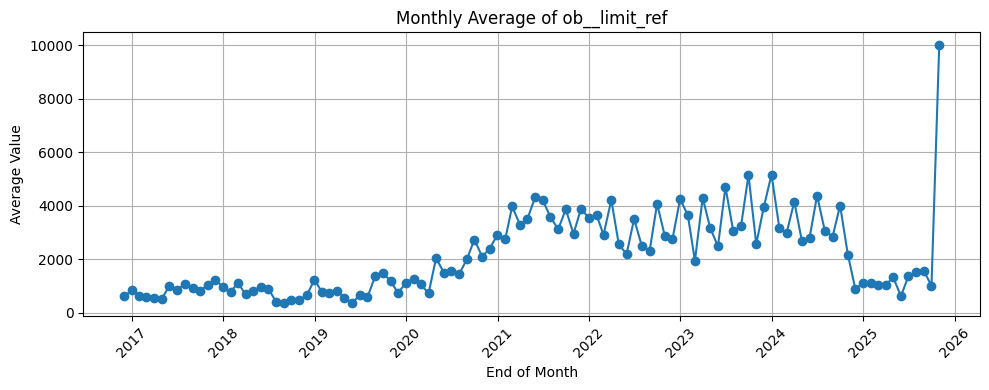

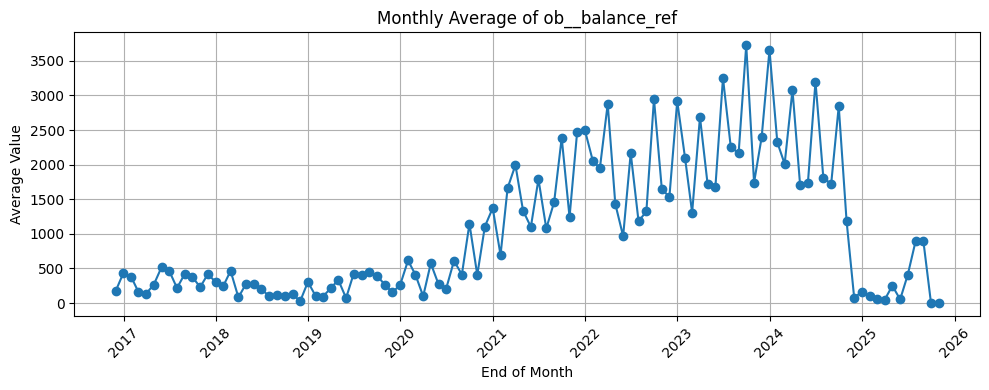

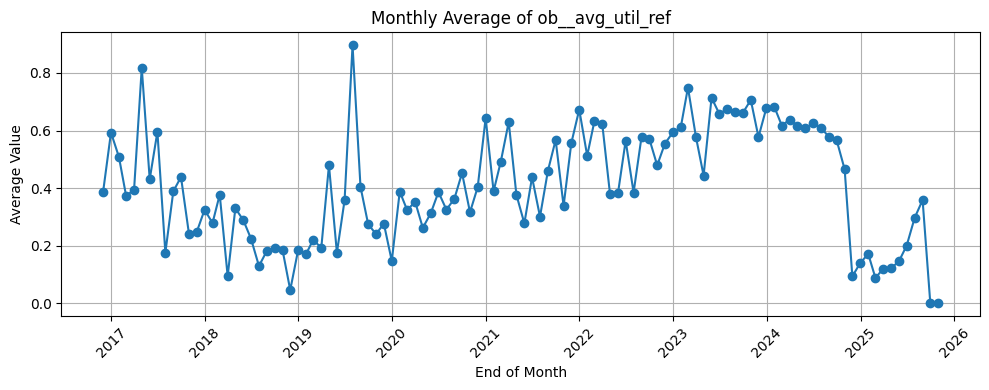

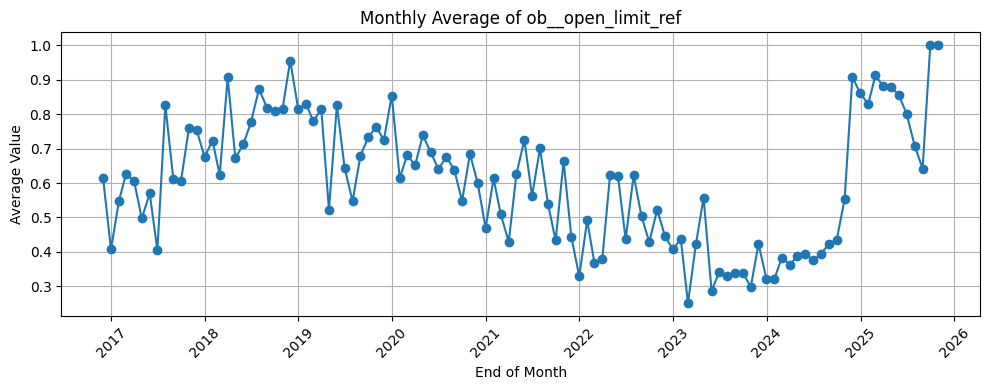

...

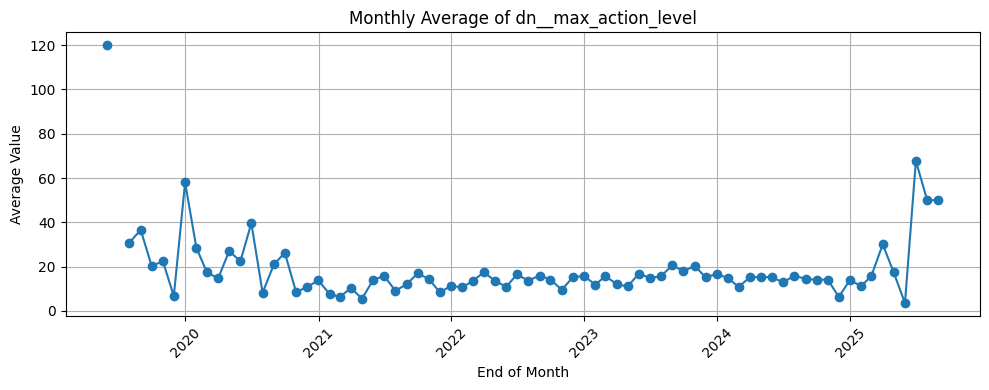

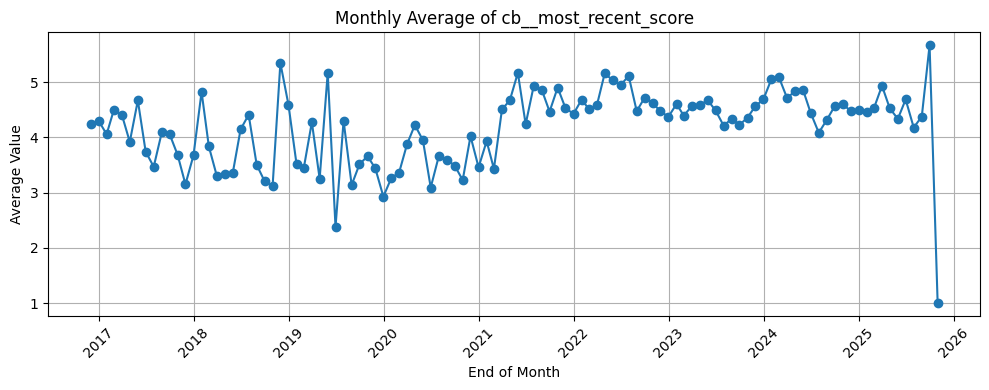

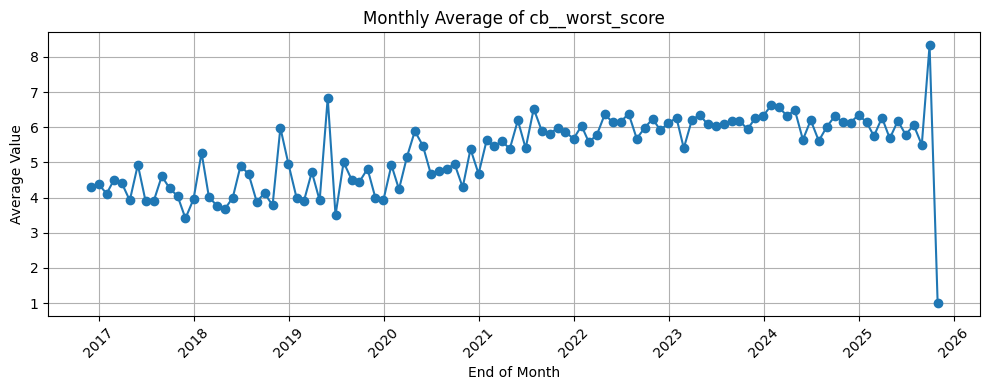

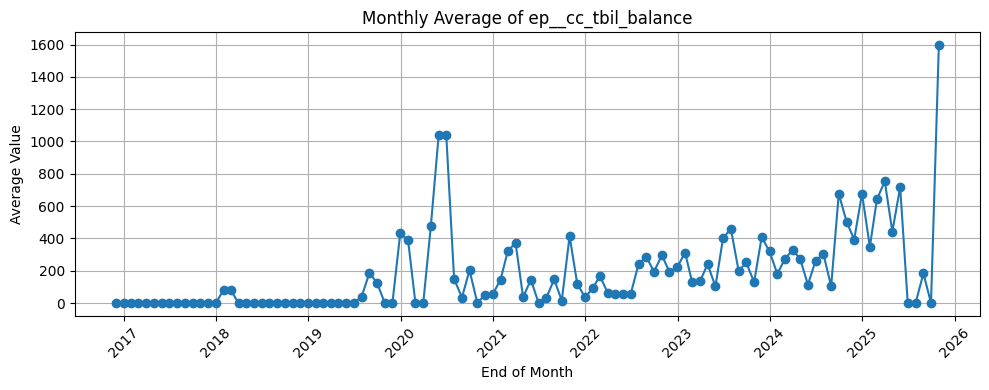

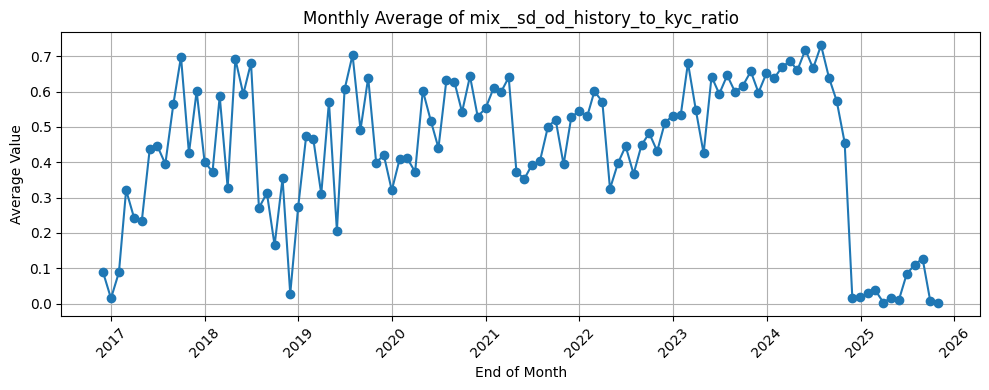

In [31]:
import matplotlib.pyplot as plt

# Assuming df_eom_avg has 'eom' as index or a column, and numeric features
if 'eom' in df_eom_avg.columns:
    df_eom_avg.set_index('eom', inplace=True)

# Loop through each feature and plot separately
for col in df_eom_avg.columns:
    plt.figure(figsize=(10, 4))
    plt.plot(df_eom_avg.index, df_eom_avg[col], marker='o')
    plt.title(f'Monthly Average of {col}')
    plt.xlabel('End of Month')
    plt.ylabel('Average Value')
    plt.xticks(rotation=45)
    plt.grid(True)
    plt.tight_layout()
    plt.show()

In [34]:
# Ensure reference_date is datetime
features['reference_date'] = pd.to_datetime(features['reference_date'])

# Create end-of-month (EOM) column
features['eom'] = features['reference_date'] + pd.offsets.MonthEnd(0)

In [35]:
features[features['eom']=='2025-10-31']

,user_id,reference_date,ob__limit_ref,ob__balance_ref,ob__avg_util_ref,t__is_drawn,t__ccf,mv__is_lisbon_v1,mv__is_lisbon_v2,mv__is_lisbon_v3,mv__is_lisbon_v4,mv__is_porto_v1,mv__is_porto_v2,madrid__avg_monthly_salary_3m,madrid__avg_monthly_expenses_3m,madrid__avg_monthly_repayment_capacity_3m,ul__is_expat,ul__is_deu,ul__is_aut,ul__account_age_months,od__history_length_days,od__is_history,ob__avg_util_0_1m,ob__avg_util_1_2m,ob__avg_util_2_6m,ob__active_days_0_3m,ob__max_util_0_1m,ob__max_util_1_2m,ob__max_util_2_6m,ob__pct_days_util_gt_80_1m,ob__pct_days_util_gt_80_3m,ob__std_util_0_1m,ob__std_util_1_2m,ob__std_util_2_6m,ob__overlimit_days_6m,ob__full_repay_6m,ab__avg_bal_0_1m,ab__avg_bal_1_2m,ab__avg_bal_2_6m,ab__max_util_0_1m,ab__max_bal_1_2m,ab__max_bal_2_6m,ab__std_util_0_1m,ab__std_util_1_2m,ab__std_util_2_6m,ab__bal_changed_1m,ab__bal_changed_3m,ab__bal_changed_6m,ab__bal_change_freq_1m,ab__bal_change_freq_3m,ab__bal_change_freq_6m,cb__most_recent_score,cb__worst_score,ep__is_cc_tbil,ep__is_cc,ep__is_tbil,ep__cc_balance,ep__tbil_balance,eom
12103,22e74016-60d3-46e2-834e-3cd720af5057,2025-10-13,10000.0,0.0,0.0,1,0.0533,0,0,0,0,0,1,3049.886667,3079.446667,1788.713333,0,1,0,19.0,1,0,0.0,0.0,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,1078.001613,1035.612,1122.979083,3359.94,3327.86,3717.46,939.524049,860.41415,932.687424,1,1,1,17,56,115,1.0,1.0,1,1,1,1446.92,149.0,2025-10-31


In [36]:
features[features['user_id']=='ea7b7815-dd37-42b5-84d2-5865296ff33a']

,user_id,reference_date,ob__limit_ref,ob__balance_ref,ob__avg_util_ref,t__is_drawn,t__ccf,mv__is_lisbon_v1,mv__is_lisbon_v2,mv__is_lisbon_v3,mv__is_lisbon_v4,mv__is_porto_v1,mv__is_porto_v2,madrid__avg_monthly_salary_3m,madrid__avg_monthly_expenses_3m,madrid__avg_monthly_repayment_capacity_3m,ul__is_expat,ul__is_deu,ul__is_aut,ul__account_age_months,od__history_length_days,od__is_history,ob__avg_util_0_1m,ob__avg_util_1_2m,ob__avg_util_2_6m,ob__active_days_0_3m,ob__max_util_0_1m,ob__max_util_1_2m,ob__max_util_2_6m,ob__pct_days_util_gt_80_1m,ob__pct_days_util_gt_80_3m,ob__std_util_0_1m,ob__std_util_1_2m,ob__std_util_2_6m,ob__overlimit_days_6m,ob__full_repay_6m,ab__avg_bal_0_1m,ab__avg_bal_1_2m,ab__avg_bal_2_6m,ab__max_util_0_1m,ab__max_bal_1_2m,ab__max_bal_2_6m,ab__std_util_0_1m,ab__std_util_1_2m,ab__std_util_2_6m,ab__bal_changed_1m,ab__bal_changed_3m,ab__bal_changed_6m,ab__bal_change_freq_1m,ab__bal_change_freq_3m,ab__bal_change_freq_6m,cb__most_recent_score,cb__worst_score,ep__is_cc_tbil,ep__is_cc,ep__is_tbil,ep__cc_balance,ep__tbil_balance,eom
9108,ea7b7815-dd37-42b5-84d2-5865296ff33a,2024-09-18,250.0,159.92,0.63968,1,1.61068,1,0,0,0,0,0,0.0,0.0,0.0,1,1,0,71.0,366,1,0.637125,0.59876,0.486546,91,0.63968,0.60008,0.56048,0.0,0.0,0.009889,0.00723,0.049245,0,0,-159.28129,-149.69,-121.636667,-150.02,-140.12,-103.52,2.472337,1.807484,12.311164,1,1,1,1,4,7,5.0,5.0,0,0,0,0.0,0.0,2024-09-30


In [31]:
reg_feats = ['ob__open_limit_ref',
 'ob__avg_util_ref',
 'ob__limit_ref',
 'madrid__avg_monthly_salary_3m',
 'ul__is_expat',
 'ob__od_enabled_zero_util_days_6m',
 'madrid__avg_monthly_expenses_3m',
 'sd__age',
 'ob__max_to_avg_util_3m_ratio',
 'ob__max_util_change_3m',
 'sd__max_daily_logins_6m',
 'ab__avg_bal_3m',
 'cb__worst_score',
 'mix__sd_od_history_to_kyc_ratio',
 'ab__days_down_6m',
 'ab__inflow_spike_count_6m',
 'sd__max_daily_logins_12m',
 'ab__std_abs_change_6m',
 'ab__std_bal_change_3m',
 'ab__near_zero_days_6m',
 'ab__bal_change_freq_3m',
 'ep__cc_tbil_balance',
 'madrid__avg_monthly_repayment_capacity_3m',
 'ab__max_bal_change_3m',
 'ob__util_last2m_to_first2m_ratio',
 'ab__avg_bal_change_3m',
 'ob__avg_util_3m',
 'ab__max_one_day_drop_6m',
 'mv__is_lisbon_v1',
 'ob__partial_repayment_events_6m']

In [32]:
t_ccf = features['t__is_drawn']
reg_mltv = features[reg_feats]

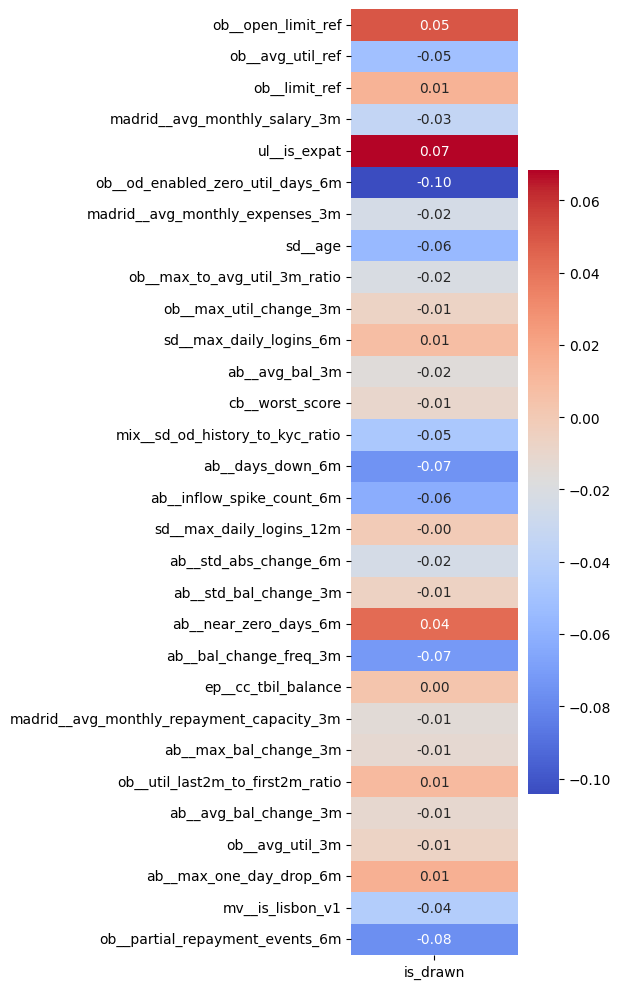

In [33]:
import matplotlib.pyplot as plt
import seaborn as sns

# corrwith returns a Series → convert to DataFrame
corr_df = reg_mltv.corrwith(t_ccf).to_frame(name="is_drawn")

plt.figure(figsize=(6, 10))

sns.heatmap(
    corr_df,
    annot=True,        # show correlation values
    fmt=".2f",         # format
    cmap="coolwarm",   # color map
    cbar=True,
    square=False       # square=True looks odd for a single column
)

plt.tight_layout()
plt.show()


In [16]:
reg_mltv.corrwith(t_ccf)

ob__limit_ref                               -0.089825
ob__max_to_avg_util_3m_ratio                 0.000228
ob__open_limit_ref                           0.036719
ob__avg_util_ref                            -0.034979
ob__max_util_3m                             -0.034759
ob__avg_util_3m                             -0.045604
madrid__avg_monthly_expenses_3m             -0.013397
ob__od_enabled_zero_util_days_6m            -0.039115
ob__partial_repayment_events_6m             -0.062174
mix__sd_od_history_to_kyc_ratio             -0.089062
sd__age_since_last_kyc                      -0.088846
ab__std_abs_change_6m                       -0.002593
sd__age                                     -0.035450
ob__util_last2m_to_first2m_1y_ratio         -0.007608
sd__max_daily_logins_12m                     0.038438
ob__std_util_3m                              0.060408
ab__bal_change_freq_3m                      -0.022136
ob__od_draw_days_6m                         -0.081059
sd__max_daily_logins_6m     

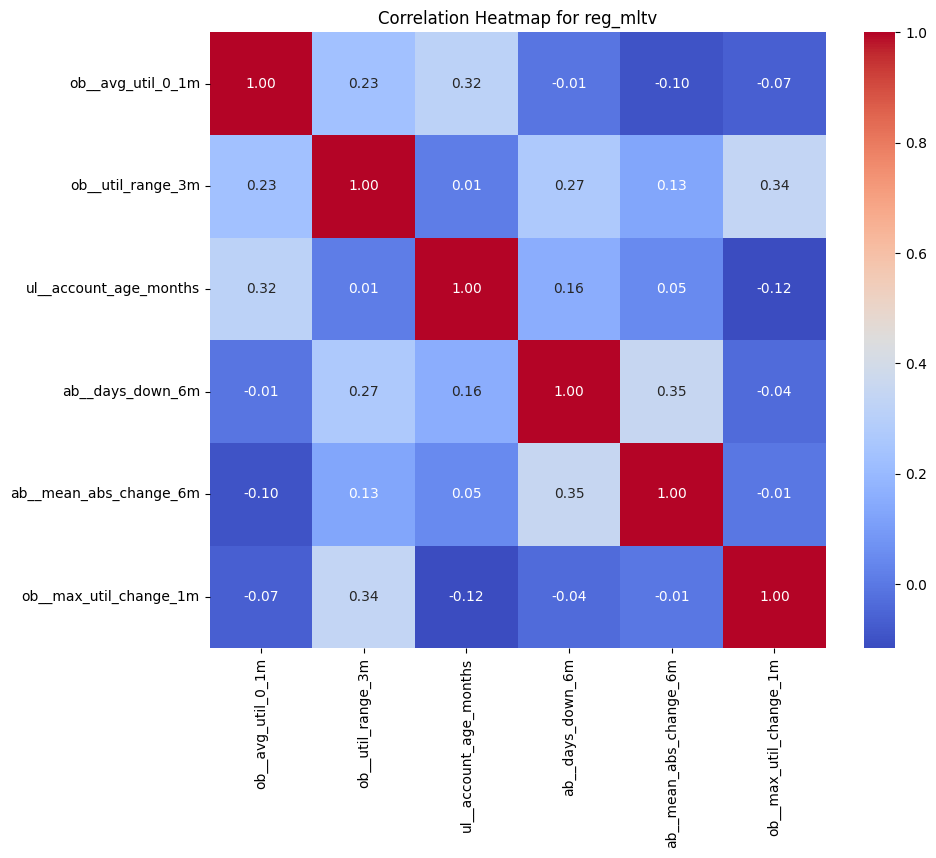

In [53]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Calculate correlation matrix
corr_matrix = reg_mltv.corr()

# Set up the matplotlib figure
plt.figure(figsize=(10, 8))

# Draw the heatmap
sns.heatmap(corr_matrix, 
            annot=True,       # show correlation values
            fmt=".2f",        # format
            cmap="coolwarm",  # color map
            cbar=True,
            square=True)

plt.title("Correlation Heatmap for reg_mltv")
plt.show()


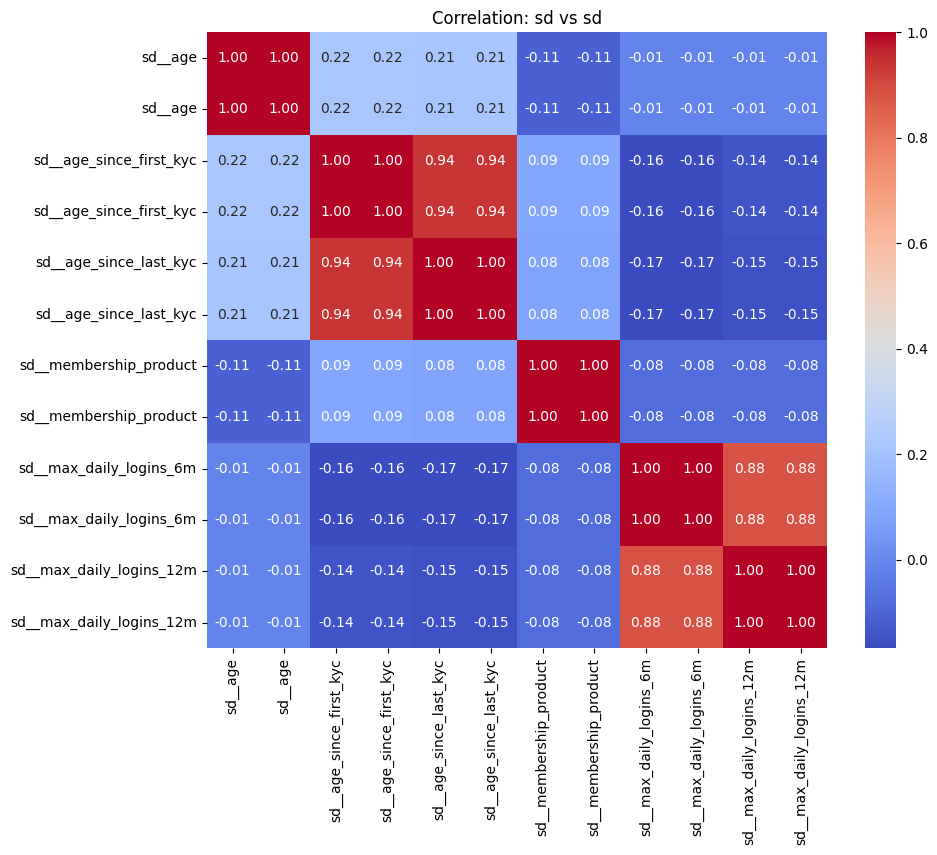

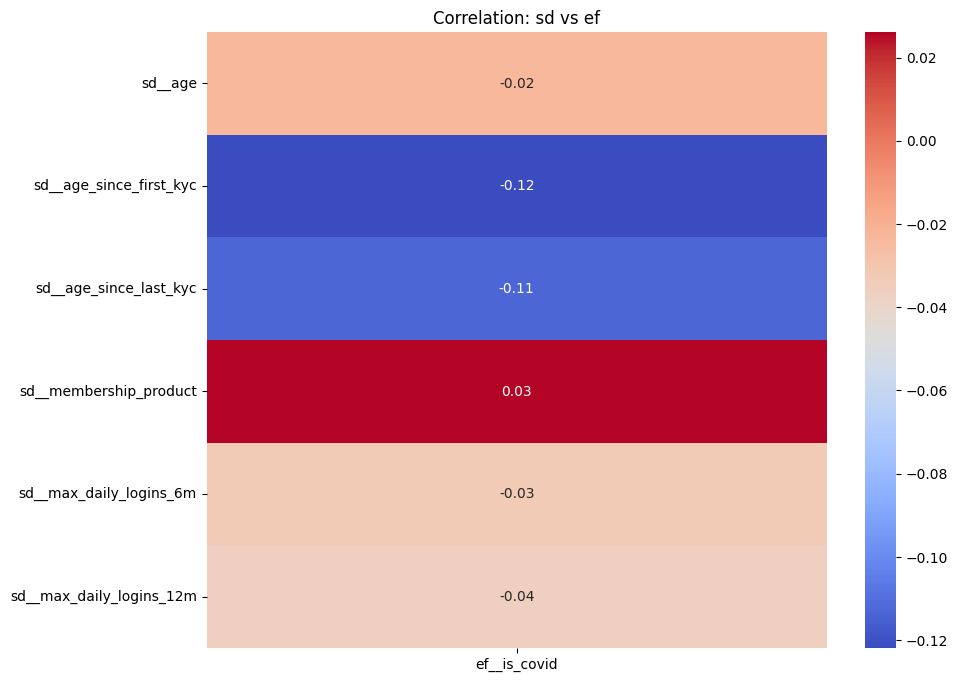

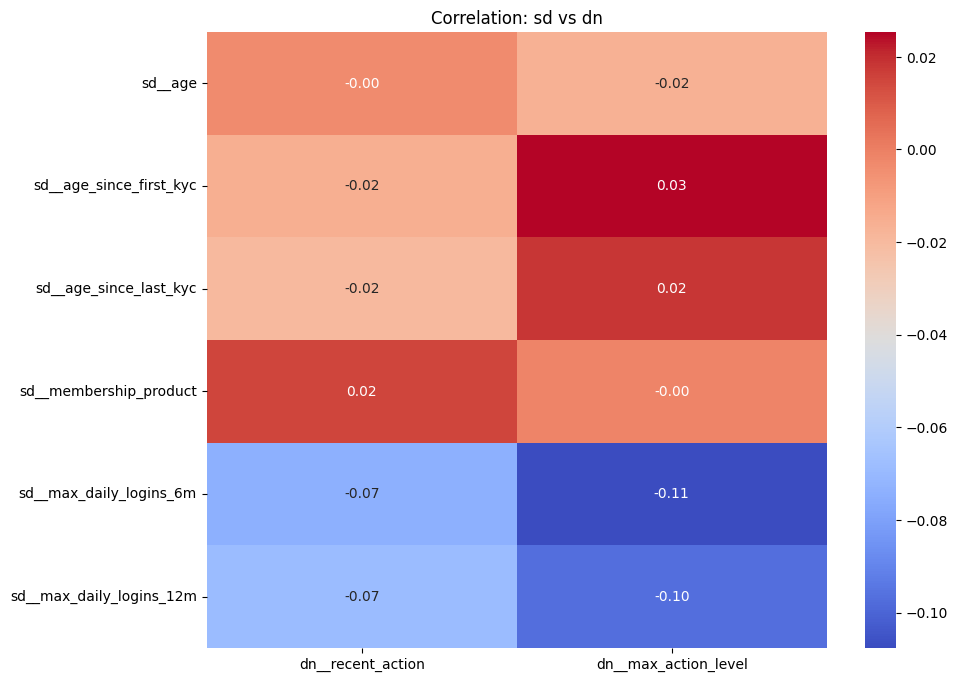

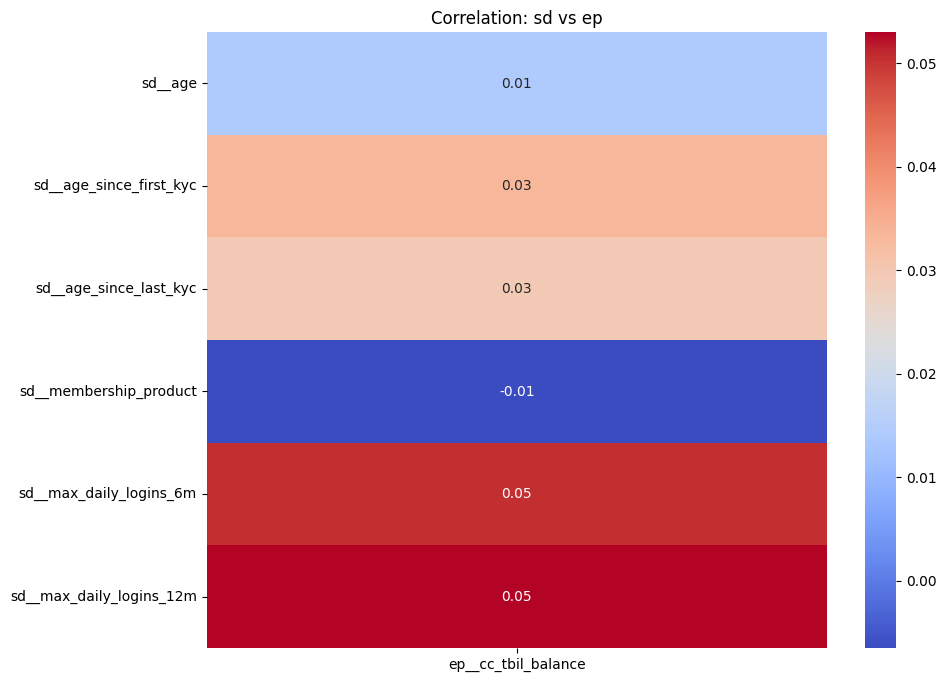

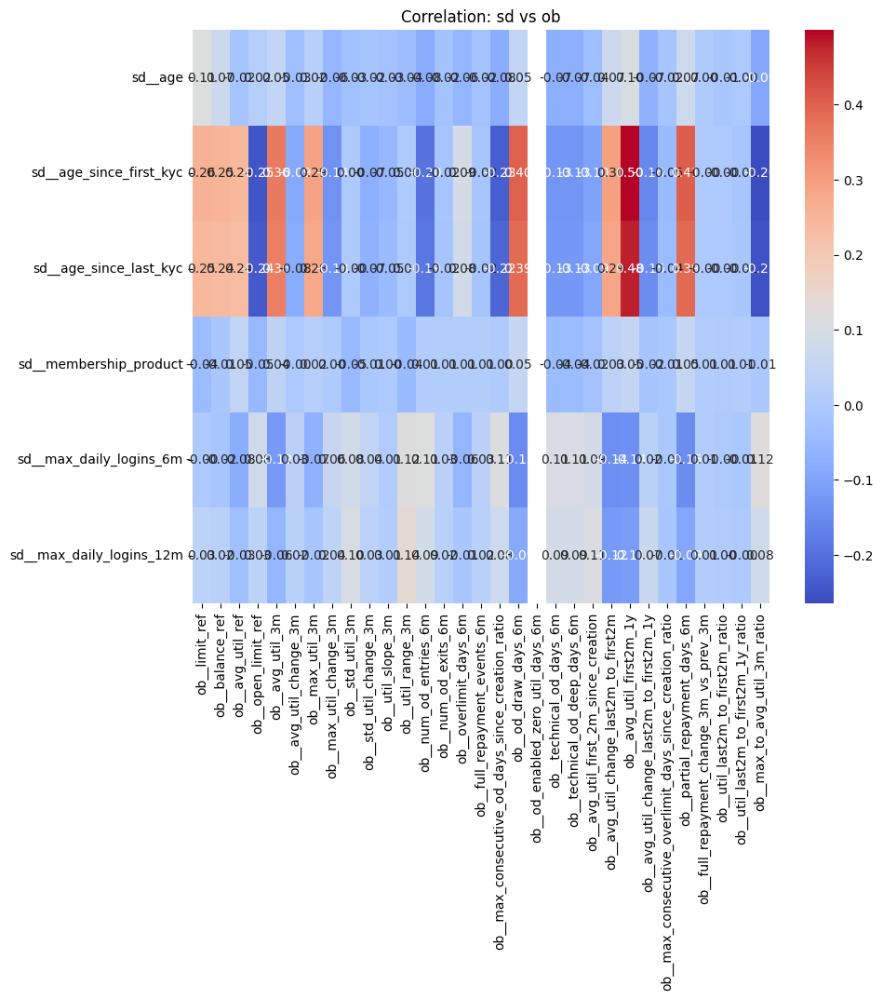

...

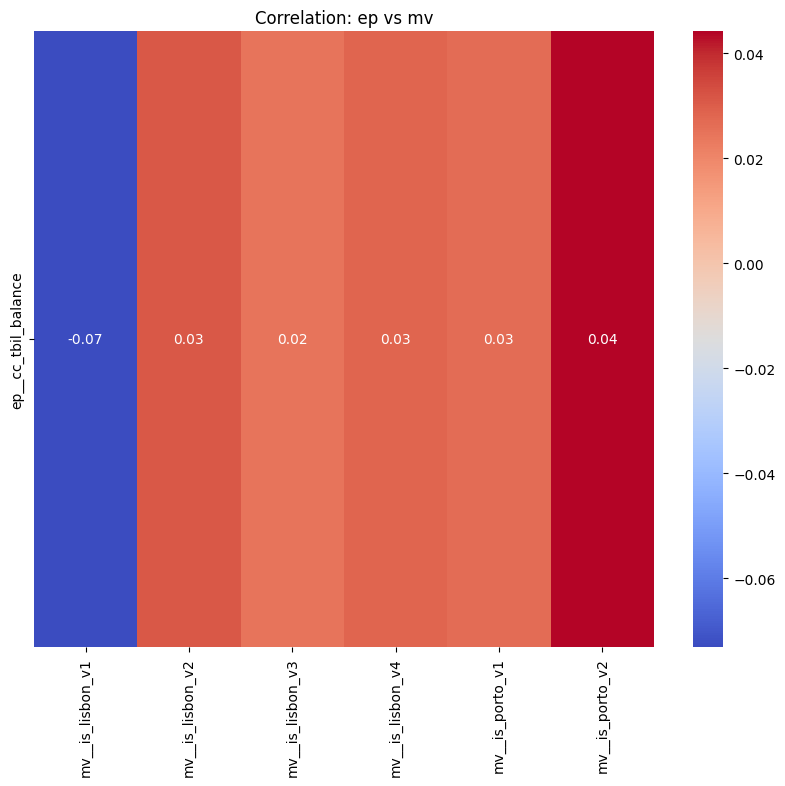

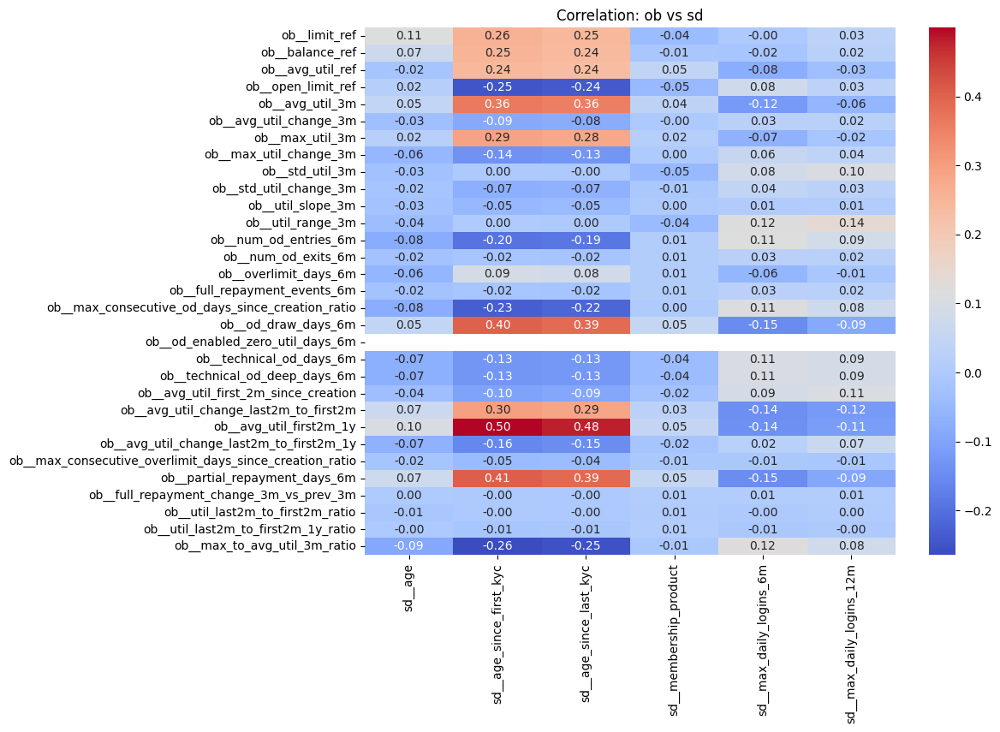

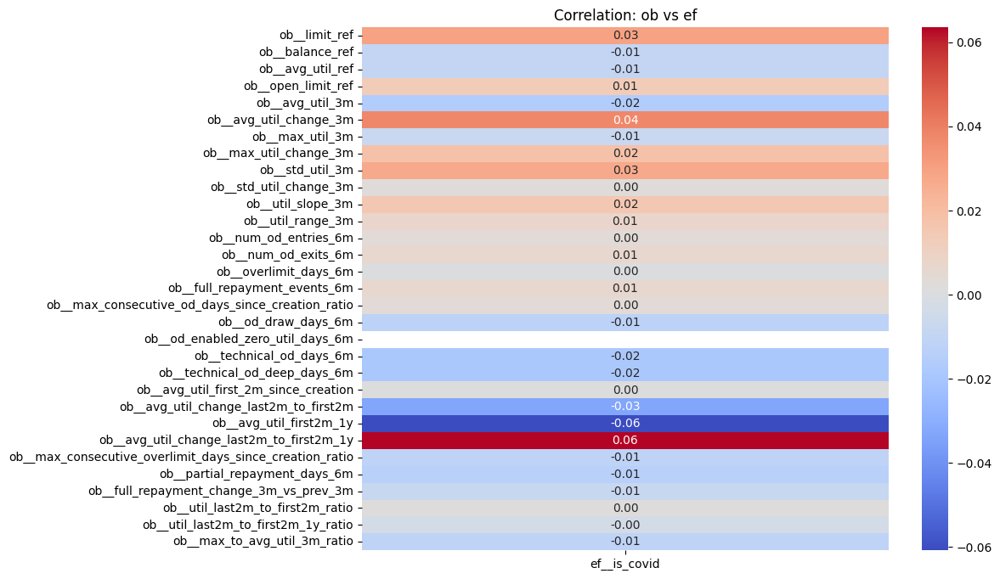

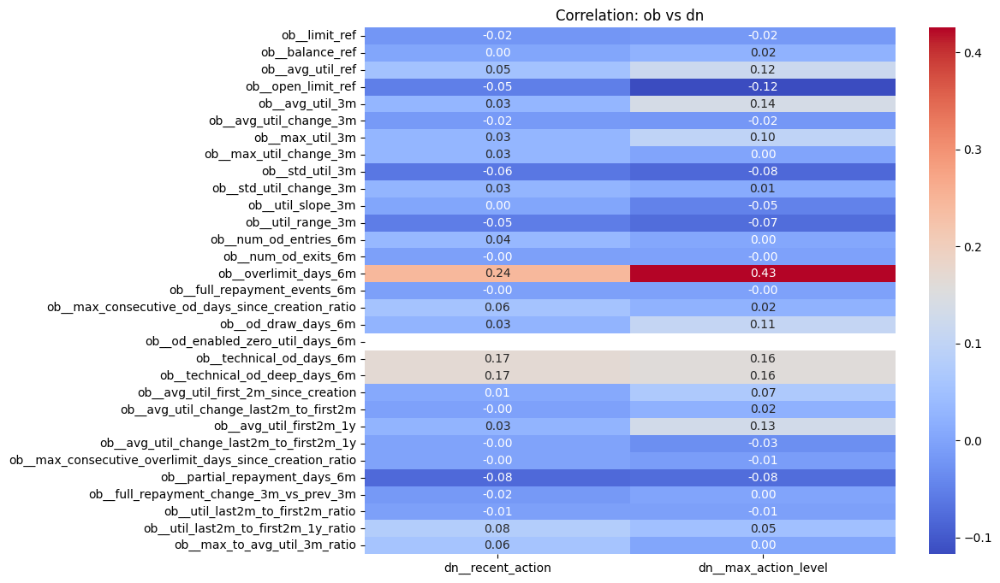

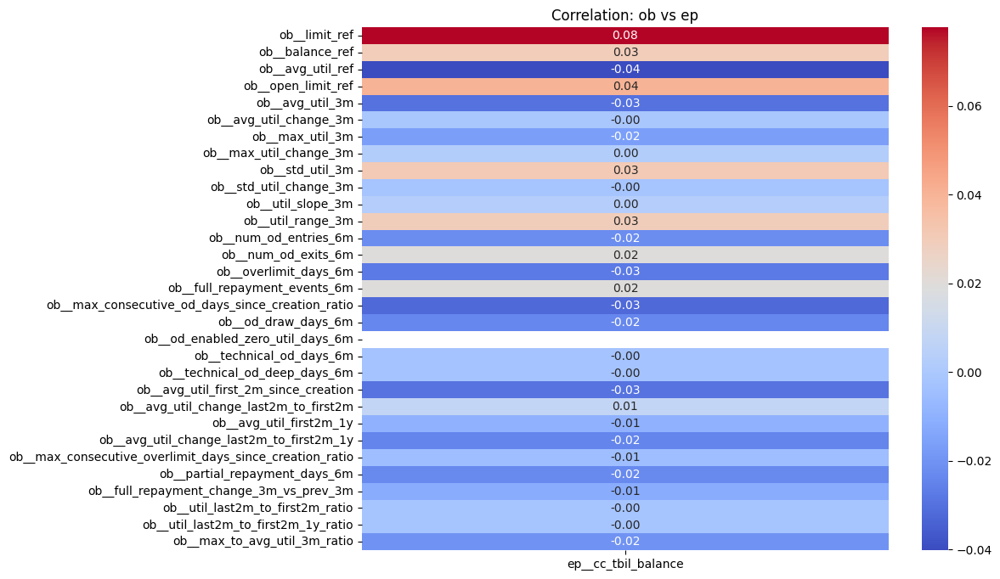

In [ ]:
group_cols = [col for col in features.columns if '__' in col]

# Extract group codes (prefix before __)
groups = list(set(col.split('__')[0] for col in group_cols))

# Step 2: Loop through all group combinations
for g1 in groups:
    for g2 in groups:
        # Columns belonging to each group
        cols_g1 = [col for col in features.columns if col.startswith(f"{g1}__")]
        cols_g2 = [col for col in features.columns if col.startswith(f"{g2}__")]
        
        # Calculate correlation
        corr_matrix = features[cols_g1 + cols_g2].corr().loc[cols_g1, cols_g2]
        
        # Step 3: Plot heatmap
        plt.figure(figsize=(10, 8))
        sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm')
        plt.title(f'Correlation: {g1} vs {g2}')
        plt.show()